# Producing article figures

This is a notebook showing the production of figures presented in Uusinoka, et al. (2024): 'Deep learning-based optical flow in fine-scale deformation mapping of sea ice dynamics'.

Figure 1 has been generated outside the Python environment and thus will not be shown here. Similarly, the RAFT deformation fields in Figure 3d have been created in a cluster environment with a separate script. For similar results, the user is encouraged to try the algorithm with the demo data provided in our Github repository.

The actual data files are not shared in the repository due to their large size (159 GB for the data sets used to generate the verification results). The data files can be shared with the user upon request or similar verification tests can be performed with the provided verification image sequences, the ground truth trajectory generator and the actual algorithm.

# Figure 2

### Figure 2a

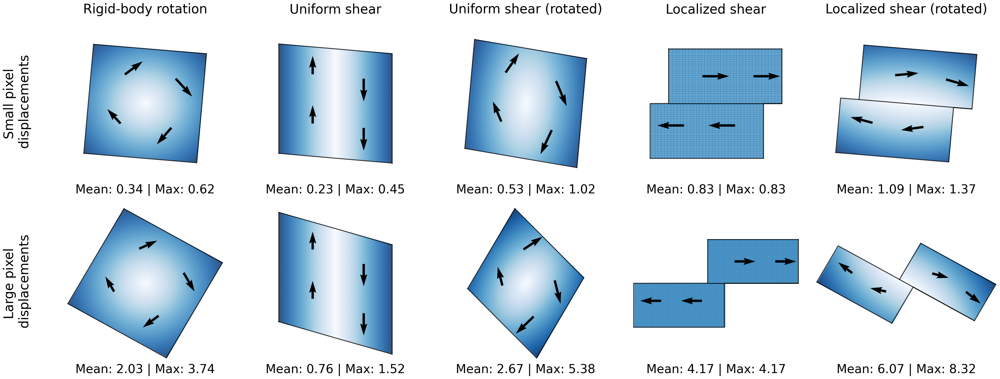

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib
colmap = matplotlib.cm.get_cmap('Blues')
blue = colmap(0.65)

scales = ['small', 'large']
tests = ['Rotated', 'Shear', 'Shear_Rotated', 'VelocityGradient', 'VelocityGradient_Rotated']
testnames = ['Rigid-body rotation', 'Uniform shear', 'Uniform shear (rotated)', 'Localized shear', 'Localized shear (rotated)']
t = 97
selective = 5


fig, ax = plt.subplots(2,5, figsize=(31,12))
fig.tight_layout(w_pad=-1, h_pad=-1)

ax[0,0].set_ylabel('Small pixel\n displacements', fontsize=30, labelpad=50)
ax[1,0].set_ylabel('Large pixel\n displacements', fontsize=30, labelpad=50)

for row, testname in enumerate(testnames):
    ax[0,row].set_title(testname, fontsize=30)
    
scals = [225, 175, 320, 550, 800, 1500, 600, 1700, 3500, 5500]
scal_idx = 0


for row, scale in enumerate(scales):
    for col, test in enumerate(tests):
        
        gt_trajectories = np.load(f'./VerificationResults/GroundTruth/{scale}_displacements/{test}.npy')[1:]/10 # Divided by 10 to transfer from meters to pixels

        disp = gt_trajectories[t] - gt_trajectories[t-1]
        disp = np.sqrt(disp[0]**2 + disp[1]**2)

        alpha = .3 if scale == 'large' and test == 'VelocityGradient_Rotated' else .4
        if test == 'VelocityGradient': ax[row,col].scatter(gt_trajectories[t,0,::selective,::selective], gt_trajectories[t,1,::selective,::selective], s=2, alpha=alpha, color=blue)
        else: ax[row,col].scatter(gt_trajectories[t,0,::selective,::selective], gt_trajectories[t,1,::selective,::selective], s=2, alpha=alpha, c=disp[::selective, ::selective], cmap='Blues')
            
        step = 90
        skip = (slice(None, None, step), slice(None, None, step))
        scaling = 50
        diff = -(gt_trajectories[t] - gt_trajectories[0])
        
        ax[row, col].quiver(gt_trajectories[t,0,::selective,::selective][0+scaling:200-scaling, 0+scaling:200-scaling][skip], 
                            gt_trajectories[t,1,::selective,::selective][0+scaling:200-scaling, 0+scaling:200-scaling][skip], 
                            diff[0,::selective,::selective][0+scaling:200-scaling, 0+scaling:200-scaling][skip], 
                            diff[1,::selective,::selective][0+scaling:200-scaling, 0+scaling:200-scaling][skip], 
                            scale = scals[scal_idx], width=.013)
        scal_idx += 1
            
        for coord in [0,999]:
            ax[row,col].plot(gt_trajectories[-1,0,coord,:],gt_trajectories[-1,1,coord,:], c='k', alpha=.8, linewidth=2)
            ax[row,col].plot(gt_trajectories[-1,0,:,coord],gt_trajectories[-1,1,:,coord], c='k', alpha=.8, linewidth=2)
            
        if test == 'VelocityGradient' or test == 'VelocityGradient_Rotated':
            ax[row,col].plot(gt_trajectories[-1,0,499,:],gt_trajectories[-1,1,499,:], c='k', alpha=.8, linewidth=2)

        ax[row,col].set_xlabel(f'Mean: {round(np.nanmean(disp),2)} | Max: {round(np.nanmax(disp),2)}', fontsize=28, labelpad=-20)
        
        ax[row,col].set_ylim(1300,-300), ax[row,col].set_xlim(1300,-300)
        if scale == 'large' and test == 'VelocityGradient_Rotated': ax[row,col].set_ylim(1550,-550), ax[row,col].set_xlim(1550,-550)
        if scale == 'large' and test == 'Shear_Rotated': ax[row,col].set_ylim(1450,-450), ax[row,col].set_xlim(1450,-450)
        if scale == 'large' and test == 'VelocityGradient': ax[row,col].set_ylim(1500,-500), ax[row,col].set_xlim(1500,-500)
        
        ax[row,col].spines['top'].set_visible(False)
        ax[row,col].spines['right'].set_visible(False)
        ax[row,col].spines['bottom'].set_visible(False)
        ax[row,col].spines['left'].set_visible(False)
        ax[row,col].set_xticks([]), ax[row,col].set_yticks([])

### Figure 2b

Text(400.22222222222223, 0.5, 'Relative EPE')

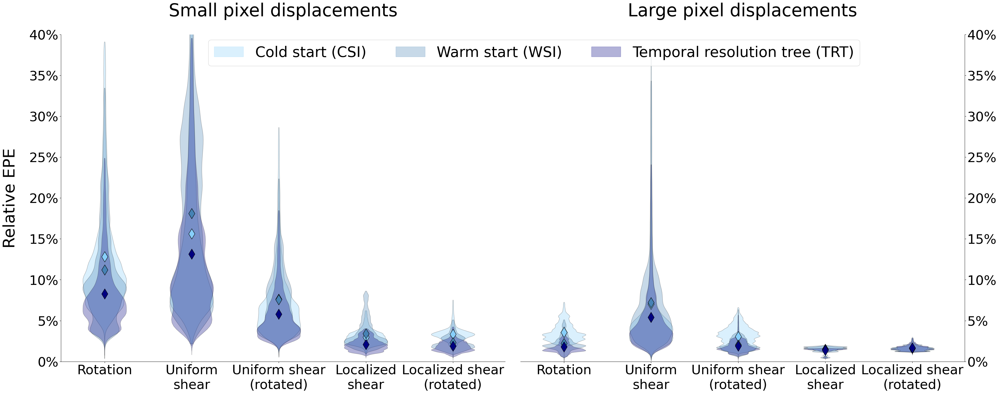

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.patches as mpatches

textsize = 44

def add_label(violin, label):
    color = violin["bodies"][0].get_facecolor().flatten()
    labels.append((mpatches.Patch(color=color), label))

initializations = ['clean_cold_traj', 'clean_warm_traj', 'clean_reso_traj']
tests = ['Rotated', 'Shear', 'Shear_Rotated', 'VelocityGradient', 'VelocityGradient_Rotated']
test_names = ['Rotation', 'Uniform\nshear', 'Uniform shear\n(rotated)', 'Localized\nshear','Localized shear\n(rotated)']

small_cold = [np.load(f'./VerificationResults/clean_cold_traj/error_estimates/perpixel_light/EPEs_small_{test}.npy')[::2] for test in tests]
small_warm = [np.load(f'./VerificationResults/clean_warm_traj/error_estimates/perpixel_light/EPEs_small_{test}.npy')[::2] for test in tests]
small_reso = [np.load(f'./VerificationResults/clean_reso_traj/error_estimates/perpixel_light/EPEs_small_{test}.npy')[::2] for test in tests]

large_cold = [np.load(f'./VerificationResults/clean_cold_traj/error_estimates/perpixel_light/EPEs_large_{test}.npy')[::2] for test in tests]
large_warm = [np.load(f'./VerificationResults/clean_warm_traj/error_estimates/perpixel_light/EPEs_large_{test}.npy')[::2] for test in tests]
large_reso = [np.load(f'./VerificationResults/clean_reso_traj/error_estimates/perpixel_light/EPEs_large_{test}.npy')[::2] for test in tests]

fig, ax = plt.subplots(1,2,figsize=(35,13))
fig.tight_layout()

for measure, name, color in zip([small_cold,small_warm,small_reso], ['Cold start (CSI)', 'Warm start (WSI)', 'Temporal resolution tree (TRT)'], ['lightskyblue','steelblue','navy']):
    
    for i in range(len(measure)): measure[i] = measure[i][measure[i] < np.nanpercentile(measure[i],97)]
    violin_parts = ax[0].violinplot(measure, showextrema=False)
    
    for pc in violin_parts['bodies']:
        pc.set_facecolor(color)
        pc.set_alpha(0.3)
        pc.set_edgecolor('black')
        
labels = []
        
for measure, name, color in zip([large_cold,large_warm,large_reso], ['Cold start (CSI)', 'Warm start (WSI)', 'Temporal resolution tree (TRT)'], ['lightskyblue','steelblue','navy']):
    
    for i in range(len(measure)): measure[i] = measure[i][measure[i] < np.nanpercentile(measure[i],97)]
    violin_parts = ax[1].violinplot(measure, showextrema=False)
    
    for pc in violin_parts['bodies']:
        pc.set_facecolor(color)
        pc.set_alpha(0.3)
        pc.set_edgecolor('black')
        
    add_label(violin_parts, name)

for j, (scale, scale_name) in enumerate(zip(['small','large'],['Small pixel displacements', 'Large pixel displacements'])):
    
    ax[j].set_title(scale_name, fontsize=textsize+4, pad=50)
    ax[j].set_xticks(np.arange(1,6),test_names)
    ax[j].yaxis.set_major_formatter(mtick.PercentFormatter(1.0, decimals=0))
    ax[j].tick_params(axis='both', which='major', labelsize=36)
    
    for i,test in enumerate(tests):
        
        for initialization, color, x_add in zip(initializations, ['lightskyblue','steelblue','navy'], [-.025,.025,0]):
            
            data = np.load(f'./VerificationResults/{initialization}/error_estimates/perpixel_light/EPEs_{scale}_{test}.npy')#[:ending]
            data = data[data < np.nanpercentile(data,97)]
            mean = np.nanmean(data)
            ax[j].scatter(i+1, mean, marker='d', s=400, color=color, edgecolors='k')

for i in range(2): 
    ax[i].spines['top'].set_visible(False)
    ax[i].set_ylim(0,.4), ax[i].set_xlim(.5,5.6)
    ax[i].set_yticks(np.arange(0,.41,.05))

ax[0].spines['right'].set_visible(False)
ax[1].spines['left'].set_visible(False)
ax[1].yaxis.tick_right()

fig.legend(*zip(*labels), loc=2, fontsize=textsize-4, bbox_to_anchor=(.165, .99), ncol=3)

ax[0].set_ylabel(r'Relative EPE', fontsize=textsize, labelpad=30)

### Figure 2c

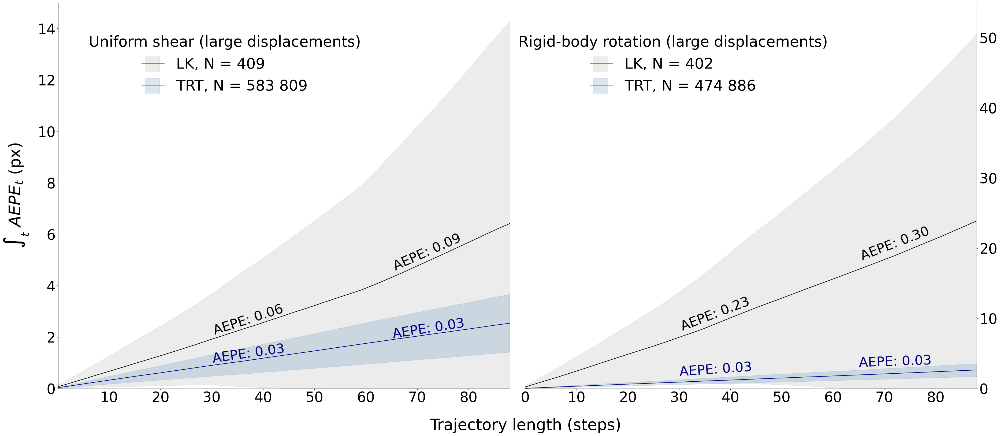

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import mpl_scatter_density
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import LogNorm
import matplotlib.patches as mpatches

fig, ax = plt.subplots(1,2,figsize=(35, 15), subplot_kw={'projection': 'scatter_density'})
fig.tight_layout()

ax[0].set_ylabel(r'$\int_{t}\ AEPE_{t}$ (px)', labelpad=20, fontsize=44)

ax[1].yaxis.tick_right()
for i in range(2): ax[i].tick_params(axis='both', which='major', labelsize=38)

ax[0].set_xlim(.1,88)
ax[1].set_xlim(0,88)

ax[0].set_xlabel('Trajectory length (steps)', rotation=0, labelpad=35, fontsize=42, x=1.035)

for i, (test, test_name) in enumerate(zip(['Shear', 'Rotated'], ['Uniform shear', 'Rigid-body rotation'])):
    raft_epes = np.cumsum(np.load(f'./VerificationResults/clean_reso_traj/full_fields_RESO/All_disp_and_epes_large_{test}.npy')[:,1], axis=0)
    vrib_epes = np.load(f'./VerificationResults/Old/error_estimates/large_displacements/VRIB/all_epes/{test}.npy')

    raft_mean, raft_median, raft_std, vrib_mean, vrib_median, vrib_std = ([] for _ in range(6))
    for t in range(raft_epes.shape[0]):
        raft_mean.append(np.nanmean(raft_epes[t])), raft_median.append(np.nanmedian(raft_epes[t])), raft_std.append(np.nanstd(raft_epes[t]))
        vrib_mean.append(np.nanmean(vrib_epes[t])), vrib_median.append(np.nanmedian(vrib_epes[t])), vrib_std.append(np.nanstd(vrib_epes[t]))
    raft_mean, raft_median, raft_std, vrib_mean, vrib_median, vrib_std = np.array(raft_mean), np.array(raft_median), np.array(raft_std), np.array(vrib_mean), np.array(vrib_median), np.array(vrib_std)

    raft_num = raft_epes[-1].flatten()
    raft_num = raft_num[~np.isnan(raft_num)].shape[0]
    raft_num = format(raft_num, ',').replace(',', ' ').replace('.', ',')
    
    vrib_num = vrib_epes[-1].flatten()
    vrib_num = vrib_num[~np.isnan(vrib_num)].shape[0]
    vrib_num = format(vrib_num, ',').replace(',', ' ').replace('.', ',')

    ax[i].plot(vrib_mean, linewidth=1.5, c='black', linestyle='solid', label=f'LK, N = {vrib_num}')
    ax[i].plot(raft_mean, linewidth=1.5, c='navy', linestyle='solid', label=f'TRT, N = {raft_num}')
    
    for count, (means, stds) in enumerate(zip([vrib_mean, raft_mean], [vrib_std, raft_std])):
        std_1, std_2 = means + stds, means - stds
        std_2[std_2<0] = 0
        if count == 0: ax[i].fill_between(np.arange(len(std_1)), std_1, std_2, color='grey',alpha=.15)
        else: ax[i].fill_between(np.arange(len(std_1)), std_1, std_2, color='steelblue', alpha=.2)

    handles, labels = ax[i].get_legend_handles_labels()
    grey_patch, blue_patch = mpatches.Patch(color='grey', alpha=.15), mpatches.Patch(color='steelblue', alpha=.2)
    handles[0], handles[1] = (grey_patch, handles[0]), (blue_patch, handles[1])
    legend = ax[i].legend(handles, labels,bbox_to_anchor=(.7, .95), ncol=1, title=f'{test_name} (large displacements)', fontsize=40, frameon=False, handlelength=1.5)
    plt.setp(legend.get_title(),fontsize=40)
    for patch in legend.get_patches(): patch.set_height(40), patch.set_y(-7.5), patch.set_width(40), patch.set_x(7.5)

    if i == 0: yes_1 = [vrib_mean[35]-.7, raft_mean[35]-.6]
    else: yes_1 = [vrib_mean[35]-(.7*3.33),raft_mean[35]-1.4]
        
    if i == 0: yes_2 = [vrib_mean[70]-.7, raft_mean[70]-.65]
    else: yes_2 = [vrib_mean[70]-(.62*3.33),raft_mean[70]-1.15]
        
    if i == 0: rotations_1 = [18,8]
    else : rotations_1 = [21,4]
        
    if i == 0: rotations_2 = [24,9]
    else : rotations_2 = [21,2]
    
    ax[i].text(30, yes_1[0], r'AEPE: {:.2f}'.format(*[round(np.nanmean(np.diff(vrib_mean[0:30])),2)])+'\n', fontsize=36, rotation=rotations_1[0])
    ax[i].text(30, yes_1[1], r'AEPE: {:.2f}'.format(*[round(np.nanmean(np.diff(raft_mean[0:30])),2)])+'\n', fontsize=36, rotation=rotations_1[1], color='navy')
    
    ax[i].text(65, yes_2[0], r'AEPE: {:.2f}'.format(*[round(np.nanmean(np.diff(vrib_mean[65:])),2)])+'\n', fontsize=36, rotation=rotations_2[0])
    ax[i].text(65, yes_2[1], r'AEPE: {:.2f}'.format(*[round(np.nanmean(np.diff(raft_mean[65:])),2)])+'\n', fontsize=36, rotation=rotations_2[1], color='navy')

ax[1].set_ylim(-3,50)
ax[0].set_ylim(-.9,15)

ax[0].spines['right'].set_visible(False)
ax[1].spines['left'].set_visible(False)
ax[1].yaxis.tick_right()

ax[0].set_ylim(0,15)
ax[1].set_ylim(0,55)

for i in range(2): ax[i].spines['top'].set_visible(False)

# Figure 3B

### Data formulation

In [ ]:
# Formulating the large data sets

import numpy as np

tests = ['Rotated', 'Shear', 'Shear_Rotated', 'VelocityGradient_Rotated']
scales = ['small', 'large']

for i, scale in enumerate(scales):
    for j, test in enumerate(tests):
        epes = np.load(f'./VerificationResults/clean_reso_traj/error_estimates/perpixel/EPEs_{scale}_{test}.npy')
        disp = np.load(f'./VerificationResults/clean_reso_traj/error_estimates/perpixel/DISP_{scale}_{test}.npy')
        
        if scale == 'large' and test == tests[3]: 
            epes, disp = [meas[disp/epes > 130] for meas in [epes, disp]]
            
        if scale == 'small' and test == tests[3]: continue
            
        if scale == 'large' and test == tests[1]: epes, disp = epes[disp < 1.4], disp[disp < 1.4]

        if i == 0: full = np.concatenate((np.expand_dims(epes, axis=0), np.expand_dims(disp, axis=0)), axis=0)
        else: full = np.hstack((full, np.concatenate((np.expand_dims(epes, axis=0), np.expand_dims(disp, axis=0)), axis=0)))
            
np.save('./VerificationResults/clean_reso_traj/Nature_full_epes_disps', full)

In [2]:
mean_x = np.linspace(0,np.nanmax(full[1]), 100)
means = []

for i in range(len(mean_x)-1):
    means.append(np.nanmean(full[0][np.where(np.logical_and(full[1]>mean_x[i], full[1]<mean_x[i+1]))]))
    
np.save('./VerificationResults/clean_reso_traj/Nature_full_means', means)

### Plotting data

In [1]:
import numpy as np
from scipy.optimize import curve_fit
def f(x, A, B): return A*x + B
import pandas as pd

full = np.load('./VerificationResults/clean_reso_traj/Nature_full_epes_disps.npy')
means = np.load('./VerificationResults/clean_reso_traj/Nature_full_means.npy')
mean_x = np.linspace(0,np.nanmax(full[1]), 100)

popt, pcov = curve_fit(f, full[1][::30], (full[0]*full[1])[::30])

import matplotlib.pyplot as plt
import mpl_scatter_density # adds projection='scatter_density'
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.ticker as mtick
from matplotlib.colors import LogNorm
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

cmap = plt.cm.get_cmap('Blues')#.reversed()
my_cmap = cmap(np.arange(cmap.N))
my_cmap[:,-1] = np.linspace(0, 1, cmap.N)
my_cmap = ListedColormap(my_cmap)

textsize = 36

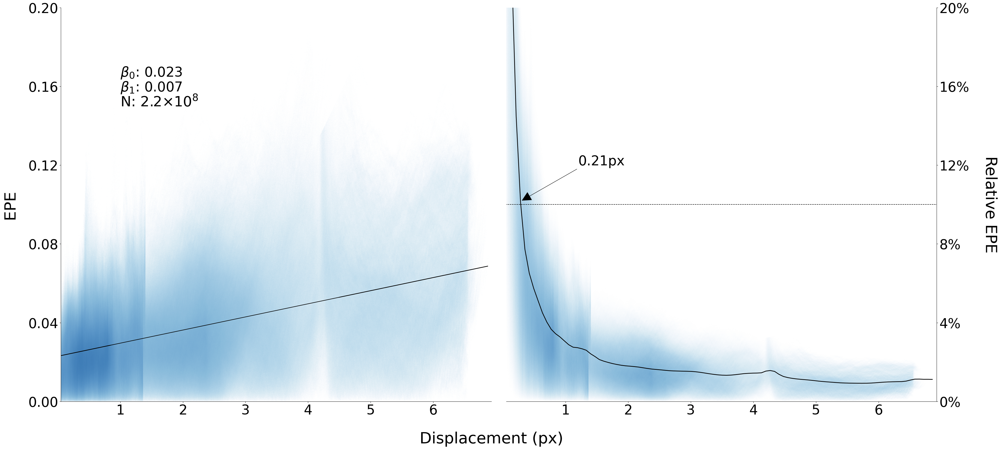

In [7]:
textsize = 38

fig, ax = plt.subplots(1,2,figsize=(35, 16), subplot_kw={'projection': 'scatter_density'})
fig.tight_layout()

ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position("right")
ax[1].yaxis.set_major_formatter(mtick.PercentFormatter(1.0, decimals=0))

for i in range(2): 
    ax[i].tick_params(axis='both', which='major', labelsize=textsize)
    ax[i].set_xlim(0,6.5)

ax[0].scatter_density(full[1], full[0]*full[1], cmap=my_cmap, norm=LogNorm(vmin=.5, vmax=13000), dpi=100)
ax[0].plot(full[1][::50]-.05, f(full[1][::50], popt[0], popt[1]), c='k')
ax[0].text(1,.165, r'$\beta_{0}$: '+f'{round(popt[1],3)}', fontsize=textsize)
ax[0].text(1,.1575, r'$\beta_{1}$: '+f'{round(popt[0],3)}', fontsize=textsize)
ax[0].text(1,.15, f'N: {round(len(full[1])/10**(8),1)}'+r'$\times$10$^{8}$', fontsize=textsize+2)

ax[0].set_ylim(.00001,.2)
ax[0].set_ylabel('EPE', fontsize=textsize+6, labelpad=30)
ax[0].set_xlabel('Displacement (px)', x=1, fontsize=textsize+6, labelpad=40)

ax[1].scatter_density(full[1], full[0], cmap=my_cmap, norm=LogNorm(vmin=10, vmax=10000), dpi=100)
ax[1].plot(mean_x[:-1], pd.Series(means).rolling(3).mean(), linewidth=2, c='k')

ax[1].hlines(.1, xmin=0, xmax=mean_x[-1], linestyle='dashed', color='black', linewidth=1.2)
ax[1].text(1.2, .12, f'{round(mean_x[np.where(np.array(means)<.1)[0][0]],2)}px', fontsize=textsize)

prop = dict(arrowstyle="-|>,head_width=1.2,head_length=2.4",
            shrinkA=0,shrinkB=0, color='k')

ax[1].annotate("", xy=(.3,.102), xytext=(1.18, .118), arrowprops=prop)

for i in range(2): ax[i].set_yticks(np.arange(0,.21,.04))
    
ax[1].set_ylim(0,.2)
ax[1].set_ylabel('Relative EPE', fontsize=textsize+6, labelpad=80, rotation=270)

ax[0].spines['right'].set_visible(False)
ax[1].spines['left'].set_visible(False)

for i in range(2): ax[i].spines['top'].set_visible(False)

# Figure 4

## A

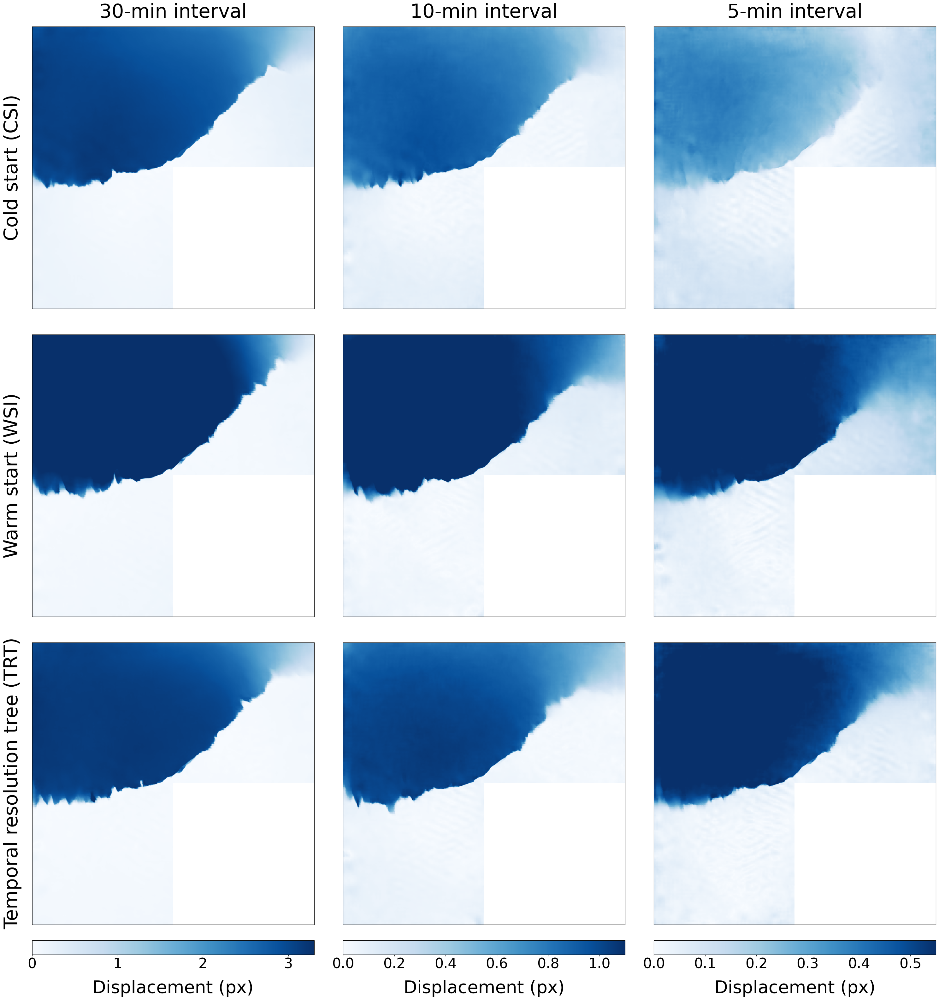

In [2]:
import numpy as np
from glob import glob
import matplotlib.pyplot as plt
import torch
from natsort import natsorted
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

cmap = plt.cm.get_cmap('Blues')
my_cmap = cmap(np.arange(cmap.N))
my_cmap[:,-1] = np.linspace(0, 1, cmap.N)
my_cmap_single = ListedColormap(my_cmap)

textsize = 40

fig, ax = plt.subplots(3,3,figsize=(30,30))
fig.tight_layout(w_pad=-1, h_pad=-3)
ax[0,0].set_ylabel('Cold start (CSI)', fontsize=textsize+4, labelpad=20)
ax[1,0].set_ylabel('Warm start (WSI)', fontsize=textsize+4, labelpad=20)
ax[2,0].set_ylabel('Temporal resolution tree (TRT)', fontsize=textsize+4, labelpad=20)

cropped_filenames = glob(f'/mnt/c/LocalUserData/User-data/uusinom1/MOSAiC_Deformation/filtered_radar_data/CROPPED_Mosaic_Minute_Data_16032020_31032020/20200316*.png')
cropped_filenames = natsorted(cropped_filenames)

img = plt.imread(cropped_filenames[960])

for i, (time, name) in (enumerate(zip([30,10,5], ['30-min interval', '10-min interval', '5-min interval']))):
    
    for row in range(3):
        ax[row,i].set_xticks([]), ax[row,i].set_yticks([])
    
    for k, fold in enumerate(['cold','warm']):
        data = torch.load(f'./testing_temporalresolutions/{fold}/{time}min', map_location=torch.device('cpu')).detach().numpy()[0]
        data[:,500:,500:] = np.nan
        img = ax[k,i].imshow(np.sqrt(data[0]**2 + data[1]**2), vmin=0, vmax=time*.11, cmap=cmap,extent=[-5000, 5000, -5000, 5000])
        if k == 0: ax[0,i].set_title(name, fontsize=textsize+4, pad=20)

        divider = make_axes_locatable(ax[k,i])
        cax = divider.append_axes('bottom', size='5%', pad=.5)
        cb = fig.colorbar(img, cax=cax, orientation='horizontal');
        cax.xaxis.set_ticks_position('bottom'), cax.xaxis.set_label_position('bottom')
        cb.ax.tick_params(labelsize=32) 
        cb.set_label('Displacement (px)', labelpad = 10, rotation=0, fontsize=textsize)
        cb.remove()
    
    data = torch.load(f'./testing_temporalresolutions/testreso_resotree/{time}min', map_location=torch.device('cpu')).detach().numpy()[0]
    #data[abs(data)<(time/10)] = 0
    data[:,500:,500:] = np.nan
    img = ax[2,i].imshow(np.sqrt(data[0]**2 + data[1]**2), vmin=0, vmax=time*.11, cmap=cmap,extent=[-5000, 5000, -5000, 5000])
    
    divider = make_axes_locatable(ax[2,i])
    cax = divider.append_axes('bottom', size='5%', pad=.5)
    cbar = fig.colorbar(img, cax=cax, orientation='horizontal');
    cax.xaxis.set_ticks_position('bottom'), cax.xaxis.set_label_position('bottom')
    cbar.ax.tick_params(labelsize=32) 
    cbar.set_label('Displacement (px)', labelpad = 20, rotation=0, fontsize=textsize)
    

# Figure 3b & 3c

In [1]:
import numpy as np

# Two time steps acting as an example
t_1, t_2 = 104, 113

tot_cold = np.load('./Example_Cases/deformations_16032020_ColdStart.npy')[2,[t_1,t_2]]
tot_warm = np.transpose(np.load('./Example_Cases/deformations_16032020_warmstart.npy')[2,[t_1,t_2]], (0,2,1))
tot_reso = np.load('./Example_Cases/deformations_16032020_resolution_tree.npy')[2,[t_1,t_2]]

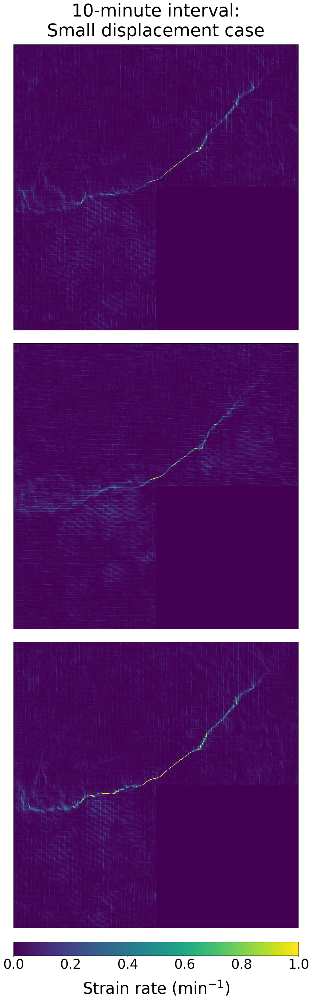

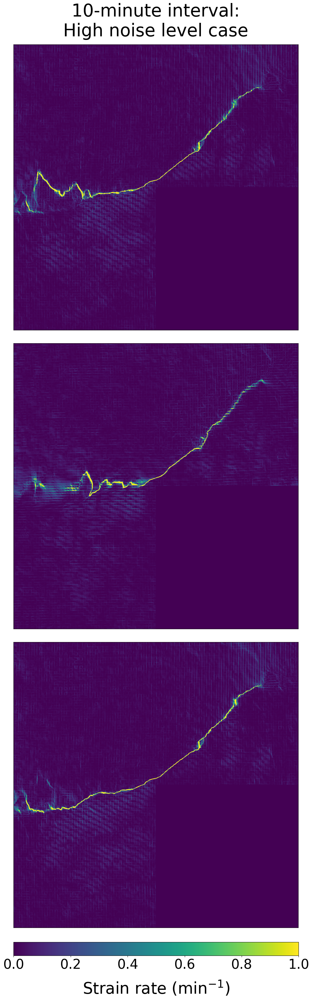

In [5]:
import matplotlib.pyplot as plt

for column, (t, ylabel) in enumerate(zip([0,1],['10-minute interval:\nSmall displacement case', '10-minute interval:\nHigh noise level case'])):
    
    fig,ax = plt.subplots(3,1,figsize=(12.5,30))
    fig.tight_layout()
    ax[0].set_title(ylabel, fontsize=42, pad=20)
        
    for i, (initialization, title) in enumerate(zip([tot_cold[t], tot_warm[t], tot_reso[t]],
                                                   ['Cold start', 'Warm start', 'Resolution tree'])): 
        
        initialization = np.nan_to_num(initialization)/10
        img = ax[i].imshow(np.transpose(initialization), vmin=0,vmax=1)
        ax[i].set_xticks([]), ax[i].set_yticks([])

    fig.subplots_adjust(right=0.8)
    
    addition = .0194
    cbar_ax = fig.add_axes([0.0191 + addition, -0.018, 0.781 - addition, 0.015])
    cb = fig.colorbar(img, cax=cbar_ax, orientation='horizontal')
    cb.ax.tick_params(labelsize=32)
    cb.set_label('Strain rate (min$^{-1}$)', labelpad = 20, rotation=0, fontsize=38)

# VRIB (Figure 3d)

Producing the VRIB data requires considerable effort and the code for handling the trajectories and estimating deformations will be only shared upon request. The actual source code for VRIB cannot be shared since we do not own the rights for the algorithm introduced in Karvonen (2016): 'Tracking the motion of recognizable sea-ice objects from coastal radar image sequences'.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import Delaunay
from numpy.linalg import matrix_power
from scipy.optimize import curve_fit
from deformation_functions import *

from matplotlib.ticker import PercentFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import ListedColormap

cmap = plt.cm.get_cmap('hot').reversed()
my_cmap = cmap(np.arange(cmap.N))
my_cmap[:,-1] = np.linspace(0, 1, cmap.N)
my_cmap = ListedColormap(my_cmap)

totaldeformations = pd.read_csv('./VRIB_data/totaldeformations_20200316.csv')

In [15]:
day, month, year = 16, '03', 2020
x, y = form_xandy_1min('./', day, month, year)

dc = pd.DataFrame(np.sqrt(x**2+y**2))
x = x[dc.loc[:, (dc<5000).all(axis=0)].columns]
y = y[dc.loc[:, (dc<5000).all(axis=0)].columns]

x, y = x.groupby(np.arange(len(x))//10).mean(), y.groupby(np.arange(len(y))//10).mean()

coordinates = []
for i in range(len(x.columns)): coordinates.append([y[y.columns[i]][0],x[x.columns[i]][0]])

delau = Delaunay(np.array(coordinates)).simplices

([], [])

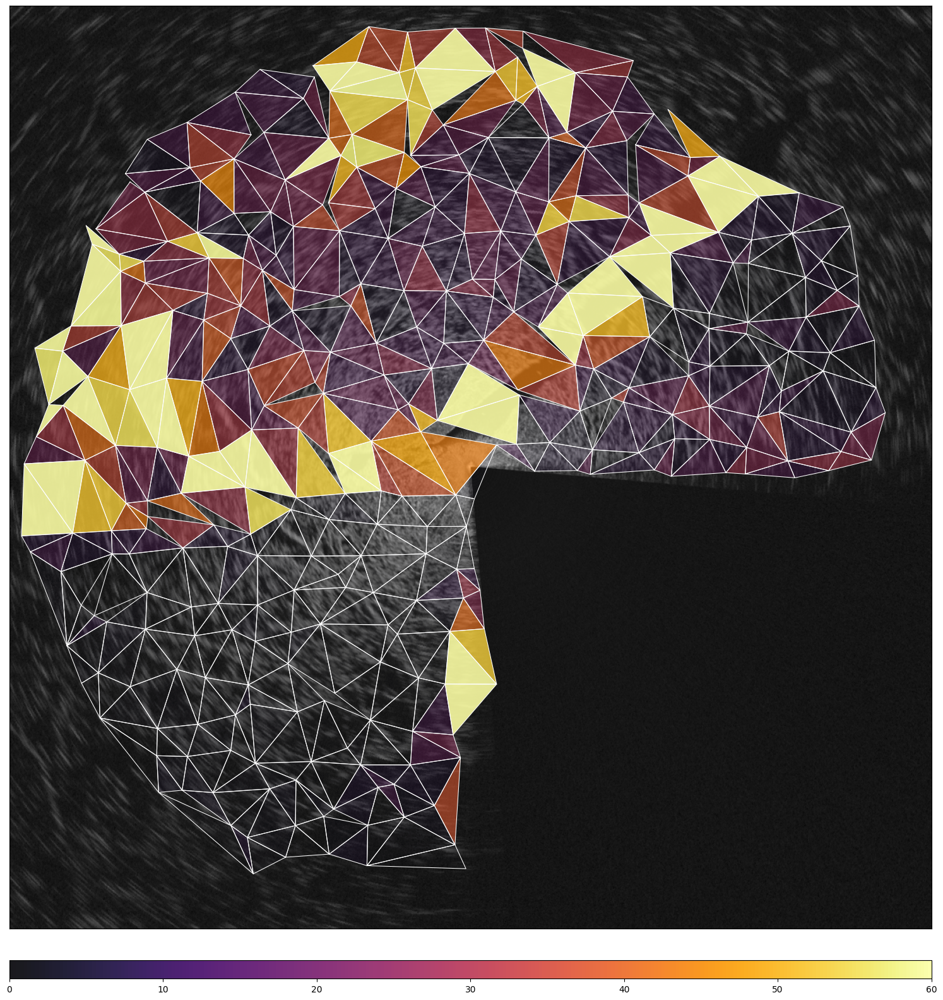

In [24]:
cmap = plt.cm.get_cmap('inferno')#.reversed()
my_cmap = cmap(np.arange(cmap.N))
my_cmap[:,-1] = np.linspace(0, 1, cmap.N)
my_cmap = ListedColormap(my_cmap)

import warnings
warnings.filterwarnings('ignore')

fig, ax = plt.subplots(1,1,figsize=(20,20))
ax.set_xlim(-5000,5000), ax.set_ylim(-5000,5000)

t = -1

minang_val = 15

img = plt.imread(f".../MOSAiC_Deformation/filtered_radar_data/160320_Fullsize/202003162350.png")
ax.imshow(img,extent=[-10000, 10000, 10000, -10000],origin='lower', cmap='gray')

for i,tri in enumerate(suitable_tris):
    if any(x[x.columns[delau[tri]]].iloc[0] > 300) and any(y[y.columns[delau[tri]]].iloc[0] > 300): continue

    vertx = np.append(list(x[x.columns[delau[tri]]].iloc[t]), list(x[x.columns[delau[tri]]].iloc[t])[0])
    verty = np.append(list(y[y.columns[delau[tri]]].iloc[t]), list(y[y.columns[delau[tri]]].iloc[t])[0])
    verty = -verty

    ax.plot(vertx, verty,linewidth=.75,color='white')
    
    try:
        polygon = ax.fill_between(vertx,verty,color='none')
        filling_div = ax.imshow(tot[i].reshape(1,1)*100, cmap=my_cmap, vmin = 0, vmax = 60,
                extent=[vertx.min(), vertx.max(), verty.min(), verty.max()],alpha=.9)
        filling_div.set_clip_path(polygon.get_paths()[0], transform=ax.transData)
    except: continue

divider = make_axes_locatable(ax)
cax = divider.new_vertical(size="2%", pad=0.5, pack_start=True)
fig.add_axes(cax)
fig.colorbar(filling_div, cax=cax, orientation="horizontal")

ax.set_yticks([]), ax.set_xticks([])